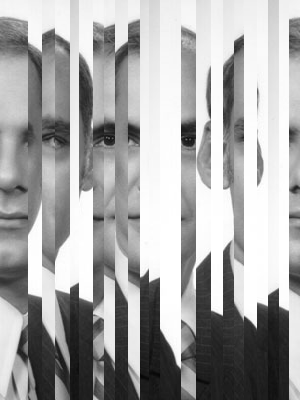

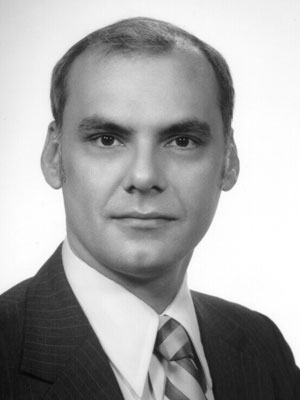

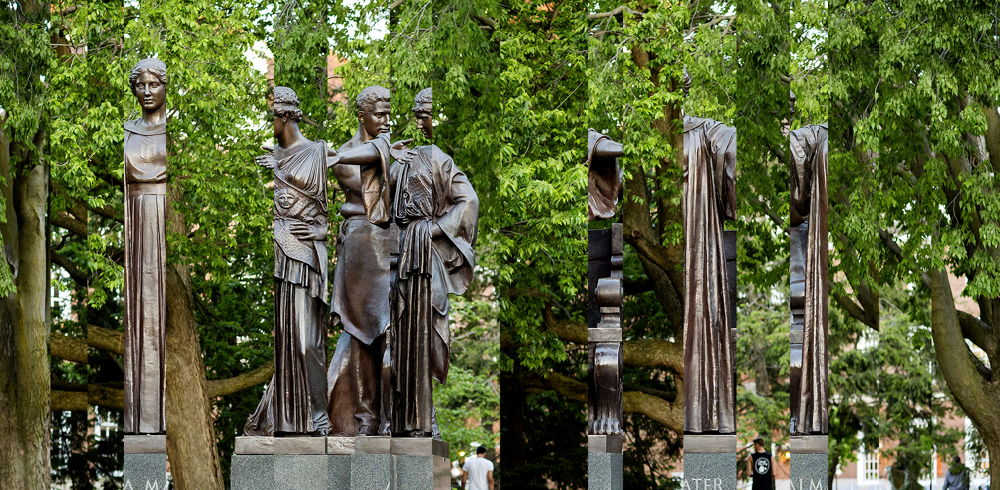

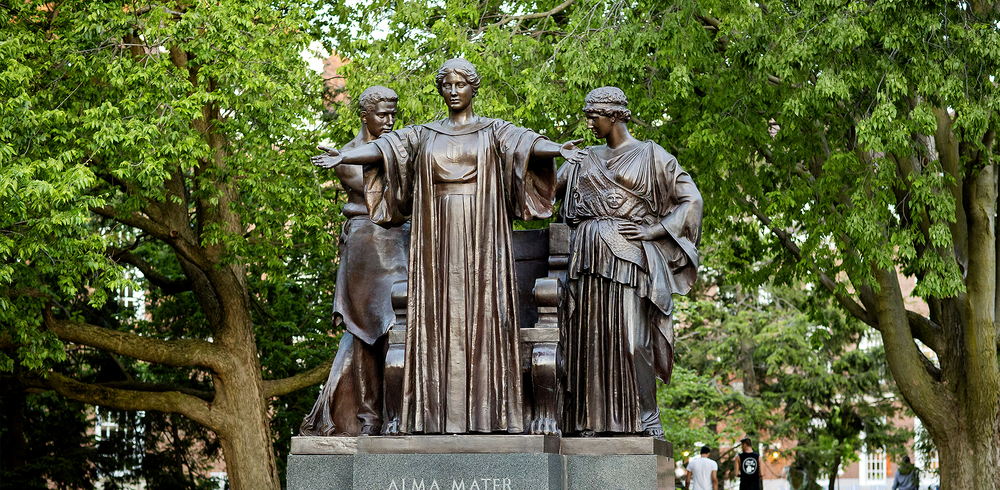

In [1]:
from PIL import Image
import os, glob
import numpy as np
from IPython.display import display

def load_images_from_folder(folder):
    image_filenames = glob.glob(os.path.join(folder, '*.png'))
    images = []
    for filename in image_filenames:
        images.append(Image.open(filename))
    return images

def calculate_similarities(images):
    similarities = np.zeros((len(images), len(images)))
    for i, ith_image in enumerate(images):
        for j, jth_image in enumerate(images):
            ith_image_pixels = np.array(ith_image)
            jth_image_pixels = np.array(jth_image)
            similarities[i, j] = -np.sum((ith_image_pixels[:, -1, :] -
                                        jth_image_pixels[:, 0, :])**2)
    return similarities

def merge_image(images, similarities):
    ordering = np.argsort(np.reshape(similarities, -1), axis=0)
    
    left_side_max_similarities_indices = list(np.argmax(
        similarities, axis=0))
    right_side_max_similarities_indices = list(np.argmax(
        similarities.T, axis=0))
    
    used_strips = set()
    
    merged_strips = [] # final image
    merged_left = None # left-most merged strip index
    merged_right = None # right-most merged strip index

    for next_item in ordering:
        # get its row and column index
        left_strip = next_item // len(images)
        right_strip = next_item % len(images)

        if left_strip == right_strip:
            continue

        if merged_left is None:
            merged_strips = images[left_strip]
            merged_right = left_strip
            merged_left = left_strip
            used_strips.add(left_strip)
            continue

        if left_strip not in used_strips:
            if left_side_max_similarities_indices[merged_left] == left_strip:
                merged_strips = np.hstack((images[left_strip], merged_strips))
                merged_left = left_strip
                used_strips.add(left_strip)

        if right_strip not in used_strips:
            if right_side_max_similarities_indices[merged_right] == right_strip:
                merged_strips = np.hstack((merged_strips, images[right_strip]))
                merged_right = right_strip
                used_strips.add(right_strip)

        if len(used_strips) == len(images):
            break

    return merged_strips
        
folders = ['shredded-image-1', 'shredded-image-2']

for folder in folders:
    images = load_images_from_folder(folder)
    shredded_image = Image.fromarray(np.hstack(images))
    display(shredded_image)

    similarities = calculate_similarities(images)
    merged_image = merge_image(images, similarities)
    merged_image = Image.fromarray(merged_image)
    display(merged_image)
